# Machine Learning for Medicine

## Parkinson's Disease Classification
*Alya Ben Abdallah & Badis Jaouani - M2 Statistics*
___
Ce notebook porte sur la classification automatique de patients selon qu'ils soient atteints de la maladie de Parkinsonou pas. La procédure consiste à enregistrer des voix et procéder par la suite à des étapes de traitement de signal. Le jeu de données comprend les transformations de l'enregistrement audio dans différentes bases qu'on détaillera par la suite. Des familles de features sont créées et l'objectif est alors de déterminer les features les plus discriminantes, autrement dit, les transformations du signal original qui apportent le plus d'information sur la présence de la maladie. 

Dans une étude préalable, une nouvelle approche pour extraire de l'information a été introduite et utilisée pour la prédiction [1]. Il s'agit de la 'Q-factor wavelet transform' (TQWT). Cette méthode conduit à une amélioration des performances des algorithmes de Machine Learning pour ce problème de classification. Dans notre étude, nous cherchons à extraire les features les plus importantes auxquelles conduit cette transformation, nous cherchons éventuellement à les combiner avec d'autres features, et voir les performances des modèles envisagés. Nous utilisons pour cela des procédures de type `SelectFDR` ou encore `LASSO` sur lesquelles nous reviendrons plus en détail. 


# Table des matières
___
1. [Import du jeu de données et preprocessing](#Import)
2. [Analyse en Composantes Principales](#Import)
3. [Feature Selection](#Import)
    1. [Variance Threshold](#Import)
    2. [SelectFdr](#Download_data)
    3. [SelectKBest](#X)  
    4. [Sélection de features LASSO](#Download_data)
        1. [Procédure de sélection et performance de la régression logistique](#X) 
        2. [Visualisation des attributs sélectionnés](#X)
        3. [Algorithmes de Machine Learning pour la classification](#X)
        4. [Dépendence de la variable cible aux features sélectionnées](#X)
    5. [Utilisation des baseline features seulement](#Import)
    6. [Utilisation des Mel Frequency Cepstral Coefficients (MFCCs) seulement](#Download_data)
    7. [Utilisation des Wavelet Transform based Features (QWT)](#X)
    8. [Utilisation des données complètes](#X)

4. [Plus de performance: stacking](#Import)    

5. [Conclusion](#Import)

In [1]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt, warnings
from IPython.display import display, HTML

In [2]:
from sklearn import linear_model
from sklearn.svm import LinearSVC, SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, StackingClassifier

In [3]:
from sklearn.preprocessing import MinMaxScaler 
from sklearn.decomposition import PCA, IncrementalPCA, KernelPCA
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.feature_selection import VarianceThreshold, SelectFdr, SelectKBest, f_classif
from sklearn import metrics
from sklearn.metrics import roc_auc_score, roc_curve

In [4]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
warnings.filterwarnings("ignore")
sns.set_style('whitegrid')

# I. Import du jeu de données et preprocessing
___

In [5]:
data = pd.read_csv("pd_speech_features.csv", sep = ",")
data.head()

,id,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,...,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36,class
0,0,1,0.85247,0.71826,0.57227,240,239,0.008064,0.000087,0.00218,...,1.5620,2.6445,3.8686,4.2105,5.1221,4.4625,2.6202,3.0004,18.9405,1
1,0,1,0.76686,0.69481,0.53966,234,233,0.008258,0.000073,0.00195,...,1.5589,3.6107,23.5155,14.1962,11.0261,9.5082,6.5245,6.3431,45.1780,1
2,0,1,0.85083,0.67604,0.58982,232,231,0.008340,0.000060,0.00176,...,1.5643,2.3308,9.4959,10.7458,11.0177,4.8066,2.9199,3.1495,4.7666,1
3,1,0,0.41121,0.79672,0.59257,178,177,0.010858,0.000183,0.00419,...,3.7805,3.5664,5.2558,14.0403,4.2235,4.6857,4.8460,6.2650,4.0603,1
4,1,0,0.32790,0.79782,0.53028,236,235,0.008162,0.002669,0.00535,...,6.1727,5.8416,6.0805,5.7621,7.7817,11.6891,8.2103,5.0559,6.1164,1


In [6]:
classes = data["class"]
display(classes)
data.drop(["class"], axis = 1, inplace = True)

0      1
1      1
2      1
3      1
4      1
      ..
751    0
752    0
753    0
754    0
755    0
Name: class, Length: 756, dtype: int64

In [7]:
print("nombre de classes :",classes.nunique())
print("classes :",classes.unique())

nombre de classes : 2
classes : [1 0]


On travaille sur un problème de classification binaire. Regardons si le jeu de données est mal équilibré, dans ce cas, nous serons amenés à augmenter les données pour permettres aux algorithmes d'apprendre correctement.

In [8]:
# Data balance
classes[classes == 1].count() / classes.count()

0.746031746031746

Le jeu de données est assez équilibré pour ne pas procéder à l'augmentation des données. On procède à présent à la standardisation.

In [9]:
scale = MinMaxScaler()
data_scale = scale.fit_transform(data)
data_scale = pd.DataFrame(data_scale)

Une fois les étapes de preprocessing achevées, nous procédons à la sélection d'attributs.

# II. Analyse en Composantes Principales
___

La première piste envisagée pour la réduction de dimension est l'ACP. Nous étudions dans cette partie 3 méthodes, dont nous discutons la capacité à fournir une représentation pertinente des données.

In [10]:
pca = PCA(n_components=20)
data_pca = pca.fit_transform(data)

kpca = KernelPCA(n_components=20)
data_kpca = kpca.fit_transform(data)

ipca = IncrementalPCA(n_components=20)
data_ipca = ipca.fit_transform(data)

#### Comparaison de la précision des quatre modèles après sélection de variables par PCA, Kernel PCA et Incremental PCA:

In [11]:
def score_model(data, classes, mod, pca, cv=5):
    if pca!=None:
        data=pca.fit_transform(data)
    return cross_val_score(mod, data, classes, cv=cv).mean()

In [12]:
score_ = []
for pca_type in [PCA(20), KernelPCA(20), IncrementalPCA(20)]:
    for mod in [RandomForestClassifier(n_estimators = 10), 
                LinearSVC(), 
                linear_model.LogisticRegression(), 
                KNeighborsClassifier(n_neighbors = 5)]:
        
        score_.append(np.round(score_model(data, classes, mod, pca_type),2))
        
SCORE = pd.DataFrame(np.array(score_).reshape(3,4), 
                   index = ["PCA","kernelPCA", "IncrementalPCA"],
                   columns = ["Random Forest", "SVC", "Logistic Regression", "KNN"])

In [13]:
SCORE

,Random Forest,SVC,Logistic Regression,KNN
PCA,0.73,0.60,0.69,0.71
kernelPCA,0.74,0.52,0.69,0.71
IncrementalPCA,0.75,0.50,0.69,0.71


Random Forest a le meilleure score (0.74) donc est le modèle qui prédit le mieux nos données de validation après réduction du nombre de variables via une ACP. Cependant, en comparant avec les résultats obtenus dans [1], l'ACP ne fournit pas une représentation des données sur laquelle les modèles arrivent à bien discriminer entre les classes. Nous envisageons alors d'autres approches, basées sur la sélection directe de variables.

# III. Feature Selection
___
Cette étape est abordée par différentes méthodes, nous citons :
- `VarianceTthreshold` qui peut être vue comme une méthode non-supervisée
- `SelectFDR` et `SelectKBest` qui font intervenir les classes
- la procédure `LASSO` que nous détaillons
- Des sélections de variables relatives à des familles de transformations [1] dans lesquelles nous retrouvons:
    - Utilisation des baseline features seulement
    - Utilisation des Mel Frequency Cepstral Coefficients (MFCCs) seulement
    - Utilisation des Wavelet Transform based Features (QWT)
    
Une comparaison avec l'utilisation de la totalité des attributs est conduite par la suite. Une approche Composantes Principales est aussi abordée.

## 1) Variance Threshold

Le but de cette sélection est de supprimer les variables qui ont une petite variance (plus petite qu'un certain seuil) et donc qui ne donnent pas d'information particulière, ni aide à prédire la classe.

In [14]:
# Variance Threshold sur données brutes
selec = VarianceThreshold(threshold = 3e+11)
selec.fit(data, classes)
var_selec_VT = data.columns[selec.get_support()]
data_VT = pd.DataFrame(selec.fit_transform(data), columns = var_selec_VT)
print("nombre de variables sélectionnées avec Variance Threshold :",data_VT.shape[1])
var_selec_VT

nombre de variables sélectionnées avec Variance Threshold : 26


Index(['det_entropy_shannon_1_coef', 'det_entropy_shannon_2_coef',
       'det_entropy_shannon_3_coef', 'det_entropy_shannon_4_coef',
       'det_entropy_shannon_5_coef', 'det_entropy_shannon_6_coef',
       'det_entropy_shannon_7_coef', 'det_entropy_shannon_8_coef',
       'det_entropy_shannon_10_coef', 'app_entropy_shannon_1_coef',
       'app_entropy_shannon_2_coef', 'app_entropy_shannon_3_coef',
       'app_entropy_shannon_4_coef', 'app_entropy_shannon_5_coef',
       'app_entropy_shannon_6_coef', 'app_entropy_shannon_7_coef',
       'app_entropy_shannon_8_coef', 'app_entropy_shannon_9_coef',
       'app_entropy_shannon_10_coef', 'app_det_TKEO_mean_8_coef',
       'app_det_TKEO_mean_9_coef', 'app_det_TKEO_mean_10_coef',
       'app_TKEO_std_7_coef', 'app_TKEO_std_8_coef', 'app_TKEO_std_9_coef',
       'app_TKEO_std_10_coef'],
      dtype='object')

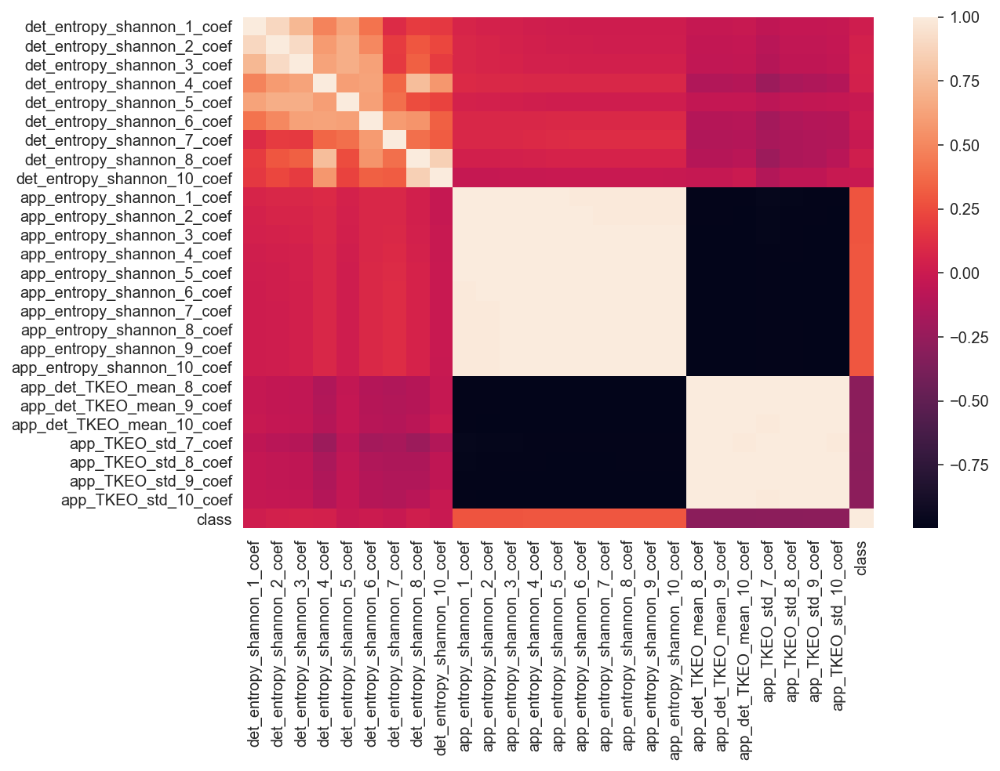

In [15]:
plt.figure(figsize = (9,6))
corr_VT=pd.concat([data_VT, classes], axis=1).corr()
sns.heatmap(corr_VT);

La corrélation entre la majorité des variables est beaucoup trop importante pour estimer que cette sélection soit pertinente.

In [16]:
# Variance Threshold sur données standardisées
selec = VarianceThreshold(threshold = 0.0399)
selec.fit(data_scale, classes)
var_selec_VT_scale = data.columns[selec.get_support()]
data_VT_scale = pd.DataFrame(selec.fit_transform(data_scale), columns = var_selec_VT_scale)
print("nombre de variables sélectionnées avec Variance Threshold sur données standardisées :",data_VT_scale.shape[1])
var_selec_VT_scale

nombre de variables sélectionnées avec Variance Threshold sur données standardisées : 26


Index(['id', 'gender', 'DFA', 'stdDevPeriodPulses', 'std_MFCC_3rd_coef',
       'tqwt_energy_dec_16', 'tqwt_energy_dec_17', 'tqwt_energy_dec_26',
       'tqwt_entropy_shannon_dec_15', 'tqwt_entropy_shannon_dec_16',
       'tqwt_entropy_shannon_dec_17', 'tqwt_entropy_shannon_dec_22',
       'tqwt_entropy_log_dec_26', 'tqwt_entropy_log_dec_27',
       'tqwt_entropy_log_dec_28', 'tqwt_minValue_dec_15',
       'tqwt_minValue_dec_25', 'tqwt_maxValue_dec_25',
       'tqwt_skewnessValue_dec_35', 'tqwt_skewnessValue_dec_36',
       'tqwt_kurtosisValue_dec_30', 'tqwt_kurtosisValue_dec_32',
       'tqwt_kurtosisValue_dec_33', 'tqwt_kurtosisValue_dec_34',
       'tqwt_kurtosisValue_dec_35', 'tqwt_kurtosisValue_dec_36'],
      dtype='object')

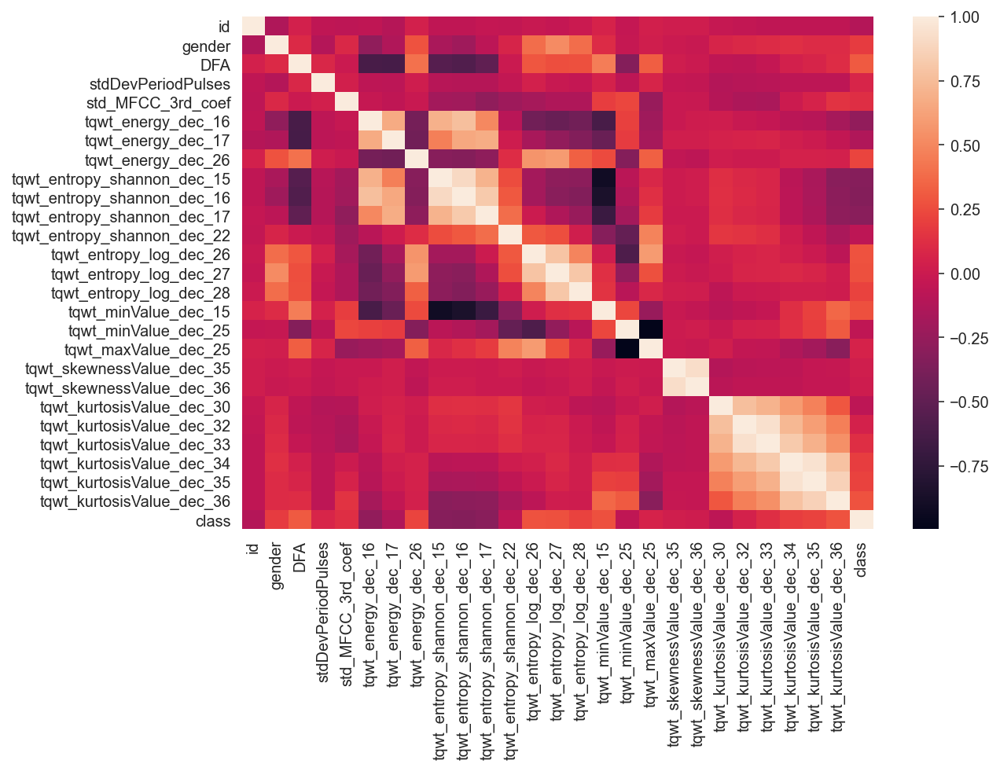

In [17]:
plt.figure(figsize = (9,6))
corr_VT_scale=pd.concat([data_VT_scale, classes], axis=1).corr()
sns.heatmap(corr_VT_scale);

#### Comparaison de la précision de six modèles après sélection de variables par Variance Threshold:
- Gradient Boosting
- Random Forest
- Linear Support Vector Classification
- Support Vector Classification
- Logistic Regression 
- K Nearest Neighbors

In [18]:
score_ = []
for data_ in [data[var_selec_VT], data[var_selec_VT_scale]]:
    for model in [GradientBoostingClassifier(), 
                  RandomForestClassifier(), 
                  LinearSVC(), 
                  SVC(),
                  LogisticRegression(), 
                  KNeighborsClassifier()]:
        
        score_.append(np.round(cross_val_score(model, data_, classes, cv = 5).mean(),2))
        
SCORE = pd.DataFrame(np.array(score_).reshape(2,6), 
                     index = ["Variance Threshold without scaling","Variance Threshold with scaling"],
                     columns = ["Gradient Boosting", "Random Forest", "Linear SVC", "SVC", "Logistic Regression", "KNN"])

In [19]:
SCORE

,Gradient Boosting,Random Forest,Linear SVC,SVC,Logistic Regression,KNN
Variance Threshold without scaling,0.73,0.73,0.74,0.73,0.75,0.71
Variance Threshold with scaling,0.72,0.70,0.69,0.78,0.74,0.75


Support Vector Classification est le modèle ayant le meilleure score (0.78), donc est le modèle qui prédit le mieux nos données de validation après réduction du nombre de variables via Variance Threshold.

In [20]:
from sklearn.model_selection import GridSearchCV
clf=GridSearchCV(SVC(kernel="rbf"), {'C':np.arange(1,10)}, cv=5, return_train_score=False)
best_param=clf.fit(data_VT_scale, classes).best_params_
print("meilleur paramètre de régularisation C =", best_param["C"])
print("score de SVC sur les données standardisées après Vairance Threshold:",np.round(clf.best_score_,2))

meilleur paramètre de régularisation C = 7
score de SVC sur les données standardisées après Vairance Threshold: 0.82


## 2) SelectFdr

SelectFdr est basée sur la procédure de Benjamini-Hochberg qui ne sélectionne que les variables correspondantes à des p-values inférieures à la plus grande p-value qui est en dessous de la droite de la fonction $ k \mapsto \frac{\alpha.k}{m}$.
Ici, seules les 26 variables correspondantes aux 26 p-values de la procédure de Benjamini-Hochberg avec un $ \alpha = 10^{-19} $ sont sélectionnées. 

In [21]:
selec = SelectFdr(alpha = 1e-19)
data_Fdr = selec.fit_transform(data, classes)
print("nombre de variables sélectionnées avec SelectFdr :",data_Fdr.shape[1])
var_selec_Fdr = data.columns[selec.get_support()] 
var_selec_Fdr

nombre de variables sélectionnées avec SelectFdr : 26


Index(['mean_MFCC_2nd_coef', 'std_8th_delta', 'std_9th_delta',
       'std_6th_delta_delta', 'std_7th_delta_delta', 'std_8th_delta_delta',
       'std_9th_delta_delta', 'std_10th_delta_delta', 'std_11th_delta_delta',
       'tqwt_entropy_shannon_dec_11', 'tqwt_entropy_log_dec_11',
       'tqwt_entropy_log_dec_12', 'tqwt_entropy_log_dec_13',
       'tqwt_TKEO_std_dec_11', 'tqwt_TKEO_std_dec_12', 'tqwt_stdValue_dec_11',
       'tqwt_stdValue_dec_12', 'tqwt_stdValue_dec_13', 'tqwt_minValue_dec_11',
       'tqwt_minValue_dec_12', 'tqwt_minValue_dec_13', 'tqwt_maxValue_dec_11',
       'tqwt_maxValue_dec_12', 'tqwt_maxValue_dec_13',
       'tqwt_kurtosisValue_dec_26', 'tqwt_kurtosisValue_dec_27'],
      dtype='object')

## 3) SeelctKBest

SelectKbest sélectionne les K variables qui sont le plus corrélées avec la variables à prédire, c'est à dire la classe.

In [22]:
selec=SelectKBest(f_classif, k=26)
selec.fit(data, classes)
var_selec_kbest=data.columns[selec.get_support()]
data_kbest=pd.DataFrame(selec.fit_transform(data,classes), columns=var_selec_kbest)
print("nombre de variables sélectionnées avec SelectKBest :",data_kbest.shape[1])
var_selec_kbest

nombre de variables sélectionnées avec SelectKBest : 26


Index(['mean_MFCC_2nd_coef', 'std_8th_delta', 'std_9th_delta',
       'std_6th_delta_delta', 'std_7th_delta_delta', 'std_8th_delta_delta',
       'std_9th_delta_delta', 'std_10th_delta_delta', 'std_11th_delta_delta',
       'tqwt_entropy_shannon_dec_11', 'tqwt_entropy_log_dec_11',
       'tqwt_entropy_log_dec_12', 'tqwt_entropy_log_dec_13',
       'tqwt_TKEO_std_dec_11', 'tqwt_TKEO_std_dec_12', 'tqwt_stdValue_dec_11',
       'tqwt_stdValue_dec_12', 'tqwt_stdValue_dec_13', 'tqwt_minValue_dec_11',
       'tqwt_minValue_dec_12', 'tqwt_minValue_dec_13', 'tqwt_maxValue_dec_11',
       'tqwt_maxValue_dec_12', 'tqwt_maxValue_dec_13',
       'tqwt_kurtosisValue_dec_26', 'tqwt_kurtosisValue_dec_27'],
      dtype='object')

In [23]:
print("ressemblance des variables sélectionnées par SelectFdr et SelctKBest:", 
      np.sum(var_selec_kbest==var_selec_Fdr)/var_selec_Fdr.shape[0] * 100,"%")

ressemblance des variables sélectionnées par SelectFdr et SelctKBest: 100.0 %


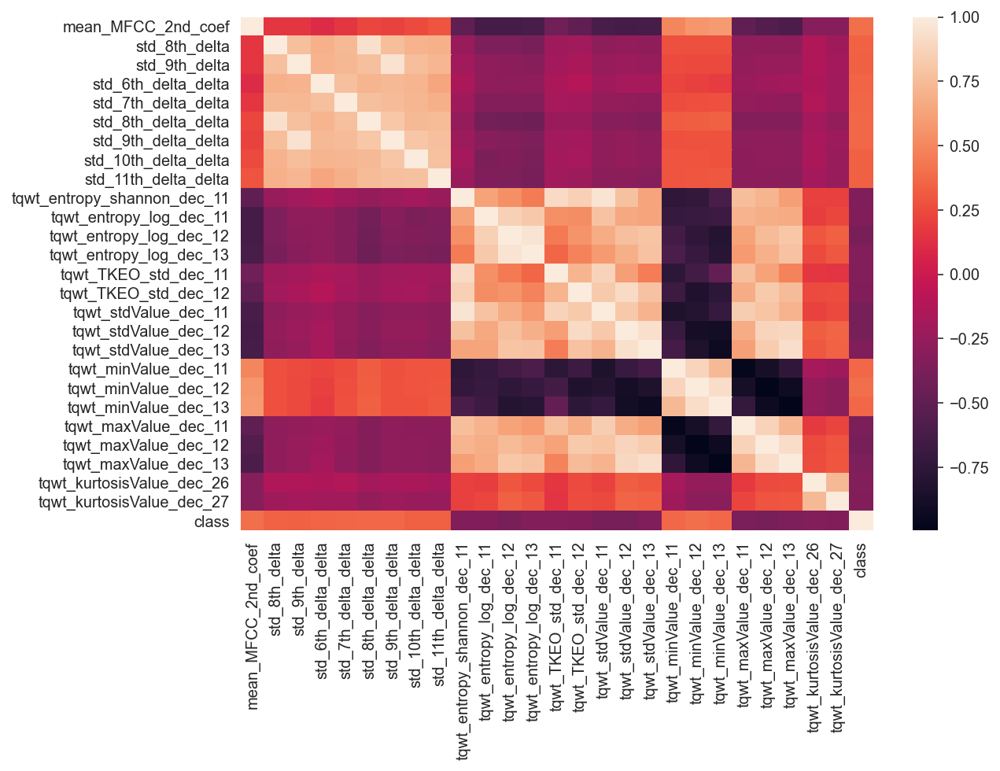

In [24]:
plt.figure(figsize = (9,6))
corr_kbest=pd.concat([data_kbest, classes], axis=1).corr()
sns.heatmap(corr_kbest);

#### Comparaison de la précision de quatre modèles après sélection de variables par SelctKbest

In [25]:
for model in [GradientBoostingClassifier(), 
              RandomForestClassifier(), 
              LinearSVC(), 
              SVC(),
              LogisticRegression(), 
              KNeighborsClassifier()]:
    print("score de", model, ":", np.round(cross_val_score(model, data_Fdr, classes, cv=5).mean(),2))  #0.8 0.81 0.45 0.74 0.81 0.75

score de GradientBoostingClassifier() : 0.8
score de RandomForestClassifier() : 0.8
score de LinearSVC() : 0.64
score de SVC() : 0.74
score de LogisticRegression() : 0.81
score de KNeighborsClassifier() : 0.75


Logistic Regression et Random Forest ont les meilleures scores (0.81), donc sont les modèle qui prédisent le mieux nos données de validation après réduction du nombre de variables via SlectKbest.

In [26]:
model_params={"Random Forest":{"model":RandomForestClassifier(), "params":{"n_estimators":[10, 50, 100], "max_depth":[1, 3, 5, 10]}}, 
              "Logistic Regression":{"model":LogisticRegression(), "params":{'C':np.arange(0.1,10)}}}

scores=[]
for model_name, mp in model_params.items():
    clf=GridSearchCV(mp["model"], mp["params"], cv=5, return_train_score=False)
    clf.fit(data_kbest, classes)
    scores.append({"model":model_name, "meilleurs paramètres":clf.best_params_, "score":clf.best_score_})
    
d=pd.DataFrame(scores, index=["Random Forest", "Logistic Regression"], columns=["meilleurs paramètres", "score"])
d

,meilleurs paramètres,score
Random Forest,"{'max_depth': 5, 'n_estimators': 10}",0.817515
Logistic Regression,{'C': 3.1},0.808226


On obtient pas de meilleurs résultas après sélection des meilleurs paramètres.

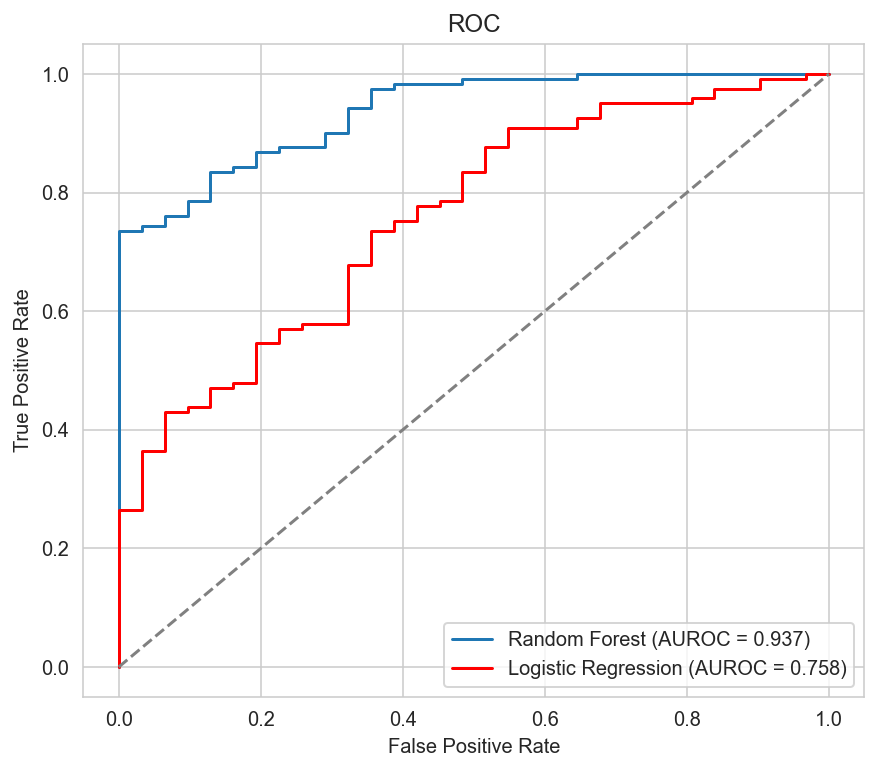

In [27]:
plt.figure(figsize = (7,6))
RF=RandomForestClassifier(**d.loc["Random Forest", "meilleurs paramètres"])
RF.fit(data_kbest, classes)

LR=LogisticRegression(**d.loc["Logistic Regression", "meilleurs paramètres"])
LR.fit(data_kbest, classes)

X_tr, X_va, y_tr, y_va = train_test_split(data_kbest, classes, test_size=0.2)


RF_proba=RF.predict_proba(X_va)[:,1]
LR_proba=LR.predict_proba(X_va)[:,1]

RF_auc=roc_auc_score(y_va, RF_proba)
LR_auc=roc_auc_score(y_va, LR_proba)

RF_fpr, RF_tpr, _=roc_curve(y_va.ravel(), RF_proba)
LR_fpr, LR_tpr, _=roc_curve(y_va.ravel(), LR_proba)

plt.plot(RF_fpr, RF_tpr, label="Random Forest (AUROC = %0.3f)" %RF_auc)
plt.plot(LR_fpr, LR_tpr, color = 'red', label = "Logistic Regression (AUROC = %0.3f)" %LR_auc)
plt.plot([0, 1], [0, 1], color = 'grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend();

Random Forest a de meilleures performances que la régression logistique sur les données réduites par SelectKBest.

## 4) Sélection de features Lasso
___
Nous introduisons à présent la méthode `LASSO` qui est une méthode d'apprentissage. Dans ce qui suit, nous regardons le nombre de variables, et les performances d'une régression logistique pénalisée par la norme $L^1$, qui conduit à des solutions sparses, autrement dit, elle sélectionne de manière automatiques les attributs. 

### 4.1) Procédure de sélection et performance de la régression logistique

In [28]:
# Train test split
X_train, X_test, y_train, y_test = train_test_split(data_scale, classes, test_size = 0.25, random_state = 0)

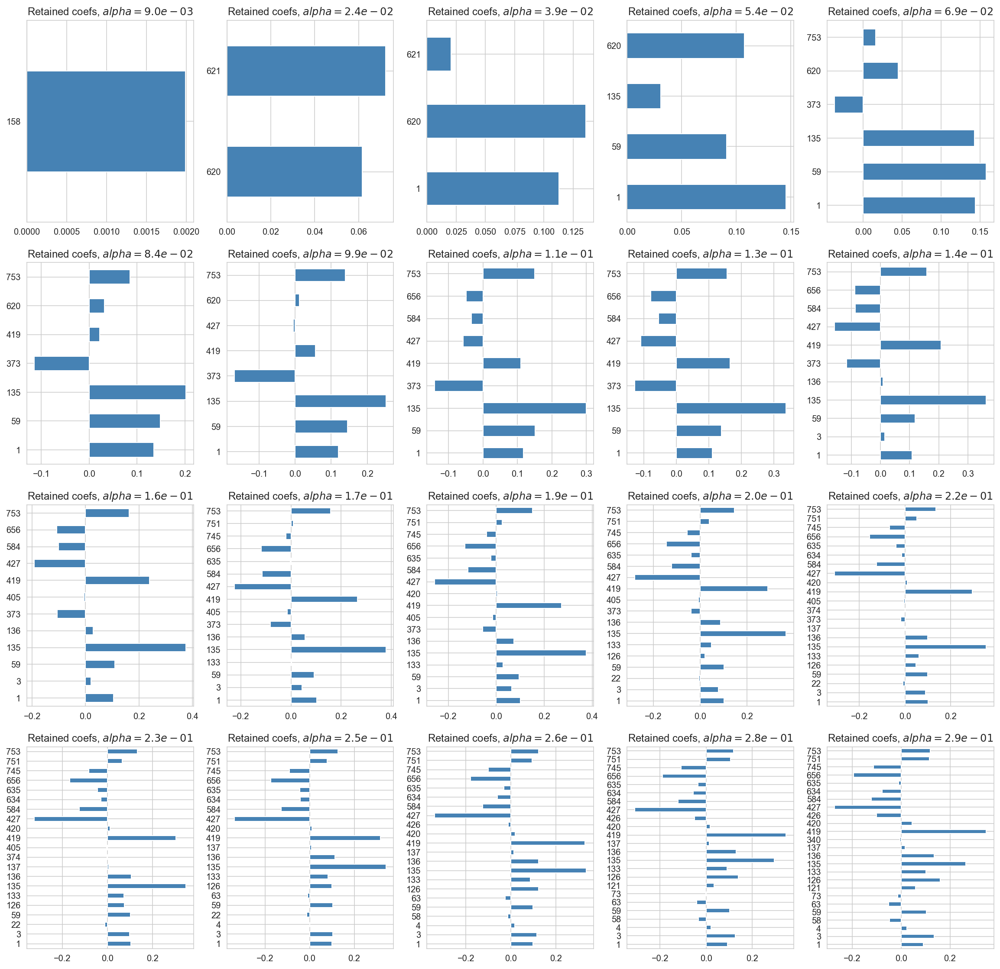

In [29]:
from sklearn.linear_model import Lasso

X_std = X_train.std(axis = 0)
alph_max = .3
Alpha, coefficients = np.arange(9e-3, alph_max, 0.015), []
score_lasso, nb_features = [], []

plt.figure(figsize = (20,30))
for fig,alph in enumerate(Alpha):
    # Fit the LASSO estimator
    lasso = LogisticRegression(C = alph, penalty = 'l1', solver = 'liblinear')
    lasso.fit(X_train, y_train)
    
    # Retrieve the selected coefs
    coefs = pd.Series(lasso.coef_.reshape(-1,), index = X_train.columns)
    coefficients.append(coefs)
    nb_features.append(np.sum(coefs != 0))
    
    # Compute scores
    score_lasso.append(lasso.score(X_test, y_test))
    
    # Plots
    plt.subplot(6,5, fig+1)
    coef_bar = pd.Series(X_std.loc[coefs != 0] * coefs[coefs != 0], index = X_train.loc[:,coefs != 0].columns)
    coef_bar.plot(kind = 'barh', color = 'steelblue')
    plt.title('Retained coefs, $alpha = %.1e$'%alph)

Plus la régularisation est faible (càd plus le paramètre `alpha` augmente), plus nombreuses sont les features sélectionnées. Regardons à présent quelles sont les attributs en question.

In [30]:
# Display the selected features
lis_features = data.columns[coef_bar.index]
for element in lis_features: 
    print(element)

gender
DFA
RPDE
mean_MFCC_1st_coef
mean_MFCC_2nd_coef
mean_MFCC_6th_coef
mean_2nd_delta
std_8th_delta
std_delta_delta_log_energy
std_6th_delta_delta
std_8th_delta_delta
std_9th_delta_delta
std_10th_delta_delta
tqwt_energy_dec_19
tqwt_entropy_log_dec_26
tqwt_entropy_log_dec_27
tqwt_entropy_log_dec_33
tqwt_entropy_log_dec_34
tqwt_stdValue_dec_11
tqwt_minValue_dec_25
tqwt_minValue_dec_26
tqwt_maxValue_dec_11
tqwt_kurtosisValue_dec_28
tqwt_kurtosisValue_dec_34
tqwt_kurtosisValue_dec_36


On retrouve les transformations en ondelettes QWT introduites par [1], et qui  s'avèrent très importantes pour la discrimination entre les classes. On retrouve également les baseline features comme la Detrended Fluctuation Analysis (DFA) et la Recurrence Period Density Entropy (RPDE) ainsi que des transformations de type Mel Frequency Cepstral Coefficients (MFCCs). L'ensemble de ces transformations conduit, comme on le voit sur la figure ci-dessous, à de très bonnes performances en considérant une régression logistique.

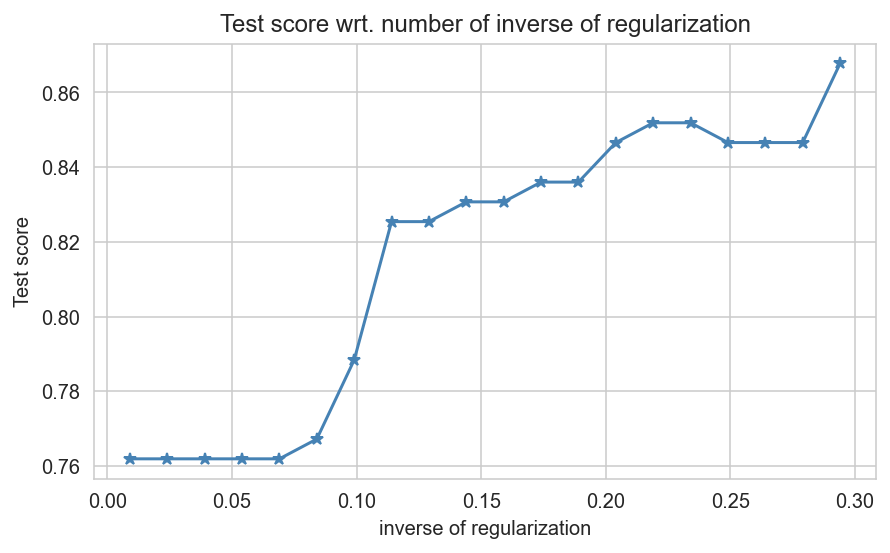

In [31]:
# Accuracy wrt. LASSO regularization
plt.figure(figsize = (7,4))
plt.plot(Alpha, score_lasso, '-*', color = 'steelblue')
plt.title(r'Test score wrt. number of inverse of regularization')
plt.xlabel('inverse of regularization')
plt.ylabel('Test score');

Explorons plus en détails les distributions des attributs sélectionnés.
### 4.2) Visualisation des attributs sélectionnés

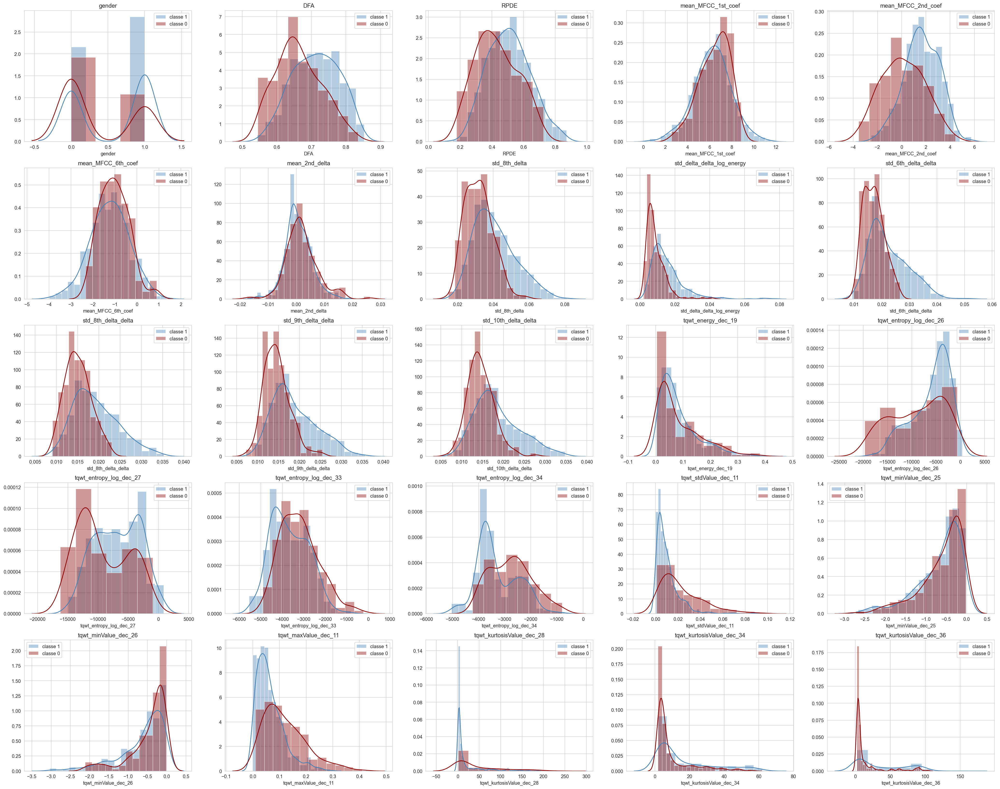

In [32]:
# Histograms of LASSO selected features
plt.figure(figsize = (36,35))
for fig, col in enumerate(lis_features):
    plt.subplot(6, 5, fig+1)
    col1 = data.loc[classes == 1, col]
    col0 = data.loc[classes == 0, col]
    sns.distplot(col1, color = 'steelblue', label = 'classe 1')
    sns.distplot(col0, color = "darkred", label = 'classe 0', hist_kws={"alpha": 0.4})
    plt.title(col)
    plt.legend()

Les distributions ont l'air semblables entre les deux classes càd qu'on n'observe pas souvent deux clusters. Toutefois, ces clusters existent pour certaines features comme celle observée sur le dernier histg-ogramme, ou encore sur le premier et le troisème histogrammes de la ligne au dessus. Certaines features sont alors plus informatives que d'autres. En l'occurence, le premier histogramme de la seconde ligne ne permet pas de faire une distinction entre les individus sains et malades.

Nous souhaitons à présent distinguer entre la répartitions des individus sains et malades selons certaines des features considérées dans le graphe précédent. On procède de la manière ci-dessous, où la couleur rouge indique les individus sains et la couleur bleue indique la présence de la maladie.

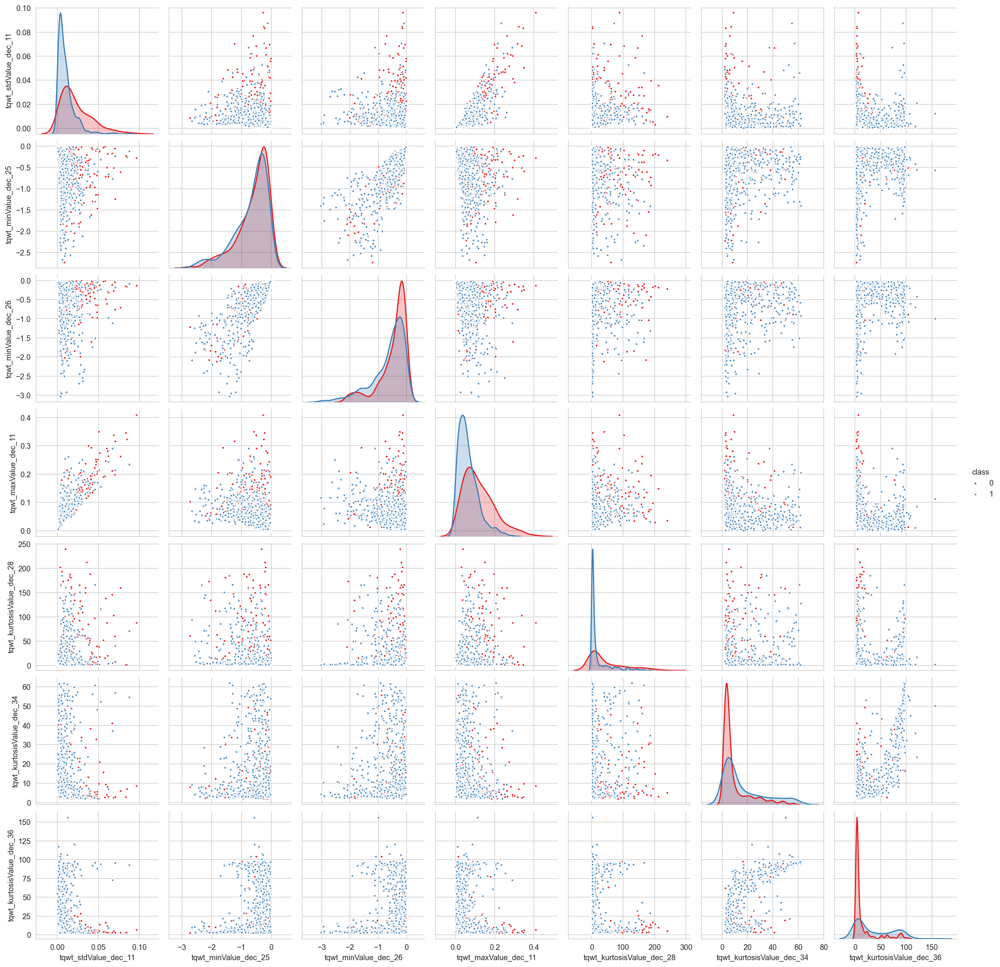

In [33]:
# Explore relationships between variables
sns.pairplot(pd.concat((data.loc[:,lis_features[18:]], classes), axis = 1), hue = 'class', 
             palette = 'Set1', markers = ['.', '*']);

Les scatter plots montrent que les données se recouvrent selon les features considérées et que la tâche de classification n'est pas simple en considérent peu de d'attributs. Ceci a pu être constaté sur la courbe donnant la précision du modèle, où la forte pénalisation conduit à un nombre limité de features et à une précision de l'ordre de 75%. 

De plus, sur les densités, on remarque que sur certaines features, les distributions des individus des différentes classes sont très proche, mais sur d'autres, des distributions très différentes sont observées, ce qui pourrait nous amener à conclure que ces features là sont importantes pour la discrimination entre les classes. 

Enfin, des structures de corrélations sont observées entre certaines variables, comme le montre le premier scatter plot de la troisième ligne, ce qui nous amène à explorer les corrélations entre les variables sélectionnées par la procédure LASSO, et la variable cible.

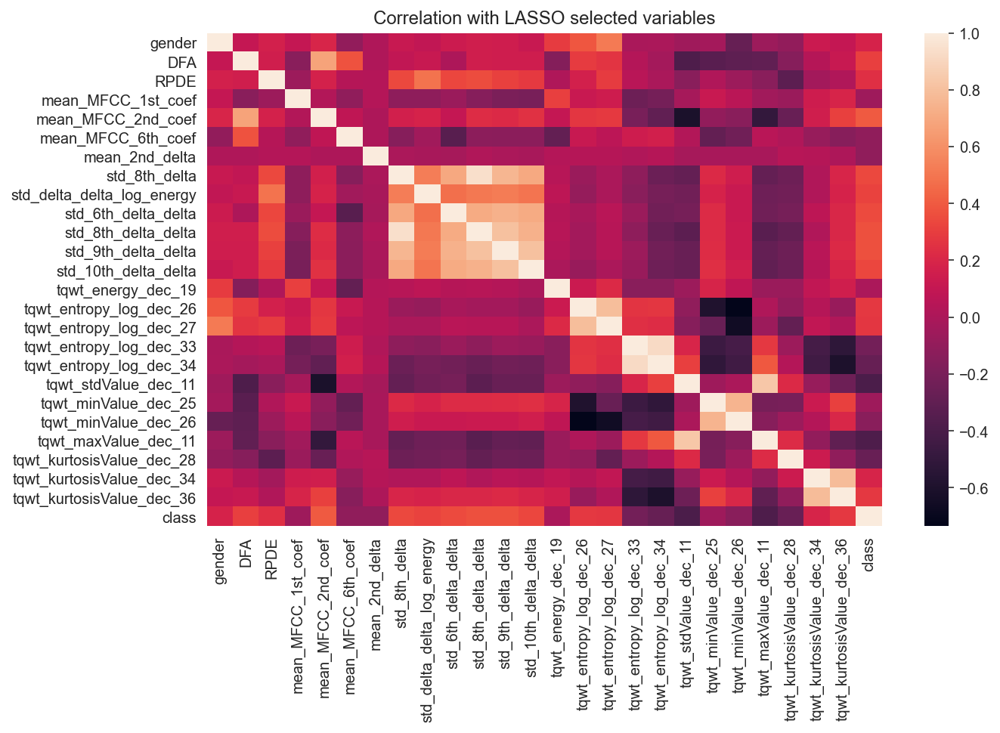

In [34]:
# Display correlation matrix
plt.figure(figsize = (10,6))
corr1 = pd.concat((data.loc[:,lis_features], classes), axis = 1).corr()
sns.heatmap(corr1)
plt.title('Correlation with LASSO selected variables');

Les transformations QWT engendrent des variables peu corrélées, contrairement aux transformations calculant l'énergie et les écats-types. La variable cible, elle, est peu corrélée avec un nombre considérable de variables, et tantot corrélée, tantot inversement corrélée avec certaines variables QWT, ce qui explique l'importance des transformations QWT pour la prédiction.

### 4.3) Algorithmes Machine Learning pour la classification
Nous allons à présent utiliser des modèles de Machine Learning pour la classification des individus, en ne considérent que les features sélectionnées par la procédure LASSO. Dans un premier temps, nous construisons le data set et ensuite aura lieu la classification.

Pour la classification, les algorithmes suivants sont utilisés: 
- `GradientBoostingClassifier`
- `RandomForestClassifier` sans équilibrer les classes
- `RandomForestClassifier` avec équilibrage des classes, pour voir s'il y a un effet de la plus forte présence de la classe des individus malades  
- `LinearSVC`
- `SVM` à noyau gaussien
- `KNeighborsClassifier`

In [35]:
# Create the data with LASSO selected features
data_lasso1 = data.loc[:,lis_features]
data_lasso = scale.fit_transform(data_lasso1)
data_lasso = pd.DataFrame(data_lasso)
data_lasso.columns = data_lasso1.columns
data_lasso.head()

,gender,DFA,RPDE,mean_MFCC_1st_coef,mean_MFCC_2nd_coef,mean_MFCC_6th_coef,mean_2nd_delta,std_8th_delta,std_delta_delta_log_energy,std_6th_delta_delta,...,tqwt_entropy_log_dec_27,tqwt_entropy_log_dec_33,tqwt_entropy_log_dec_34,tqwt_stdValue_dec_11,tqwt_minValue_dec_25,tqwt_minValue_dec_26,tqwt_maxValue_dec_11,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_36
0,1.0,0.565310,0.583000,0.722779,0.648846,0.462952,0.394503,0.198306,0.190650,0.125508,...,0.785314,0.187137,0.302062,0.052966,0.914344,0.850536,0.054346,0.000219,0.012611,0.107598
1,1.0,0.489455,0.537514,0.724860,0.692990,0.432672,0.465535,0.108627,0.161908,0.380722,...,0.769078,0.200928,0.303615,0.053197,0.949070,0.889617,0.196641,0.000206,0.077525,0.277905
2,1.0,0.428738,0.607479,0.645606,0.727579,0.466983,0.568607,0.261785,0.499489,0.359732,...,0.725181,0.203117,0.317037,0.031539,0.913150,0.917938,0.032368,0.000229,0.017594,0.015595
3,0.0,0.819111,0.611315,0.563136,0.714858,0.623976,0.413742,0.265568,0.179630,0.187372,...,0.538671,0.518850,0.615255,0.046091,0.135297,0.581640,0.270785,0.009530,0.049618,0.011011
4,0.0,0.822669,0.524431,0.538102,0.697982,0.649625,0.495972,0.256704,0.119722,0.105506,...,0.516834,0.494127,0.589317,0.039795,0.162070,0.610229,0.210449,0.019569,0.105554,0.024357


In [36]:
# Prediction using different models
for model in [GradientBoostingClassifier(n_estimators = 500, max_depth = 3),
              RandomForestClassifier(n_estimators = 200, class_weight = 'balanced'),
              RandomForestClassifier(n_estimators = 200, class_weight = None),
              LinearSVC(), 
              SVC(kernel = 'rbf', C = 1),
              linear_model.LogisticRegression(), 
              KNeighborsClassifier(n_neighbors = 10)]:
    print("score de", model, ":", np.round(cross_val_score(model, data_lasso, classes, cv = 5).mean(),2))

score de GradientBoostingClassifier(n_estimators=500) : 0.87
score de RandomForestClassifier(class_weight='balanced', n_estimators=200) : 0.85
score de RandomForestClassifier(n_estimators=200) : 0.85
score de LinearSVC() : 0.85
score de SVC(C=1) : 0.87
score de LogisticRegression() : 0.86
score de KNeighborsClassifier(n_neighbors=10) : 0.83


La procédure de sélection LASSO engendre des variables sur lesquelles les algorithmes ML arrivent mieux à discriminer entre les classes et résulte en de meilleures performances de tous les algorithmes considérés. Le LASSO sélectionne un bon nombre de ces variables-là, en plus de certaines features issues d'autres transformations, et qui s'avèrent être importantes pour la classification.

Dans ce qui suit, nous inspectons le lien entre la prédiction d'une certaine classe et certaines variables.

### 4.4) Dépendence de la variable cible aux features sélectionnées

L'outil pour explorer la dépendence est le `PartialDependecyPlot` qui trace la probabilité d'obtenir une certaine classe en ne faisant varier qu'une seule feature. le tracé représente la moyenne sur tous les individus. C'est une méthode permettant d'explorer ce que le modèle apprend. 

In [37]:
# Train test split
X_train_lasso, X_test_lasso, y_train_lasso, y_test_lasso = train_test_split(data_lasso1, 
                                                                            classes, 
                                                                            test_size = 0.25, 
                                                                            random_state = 0)

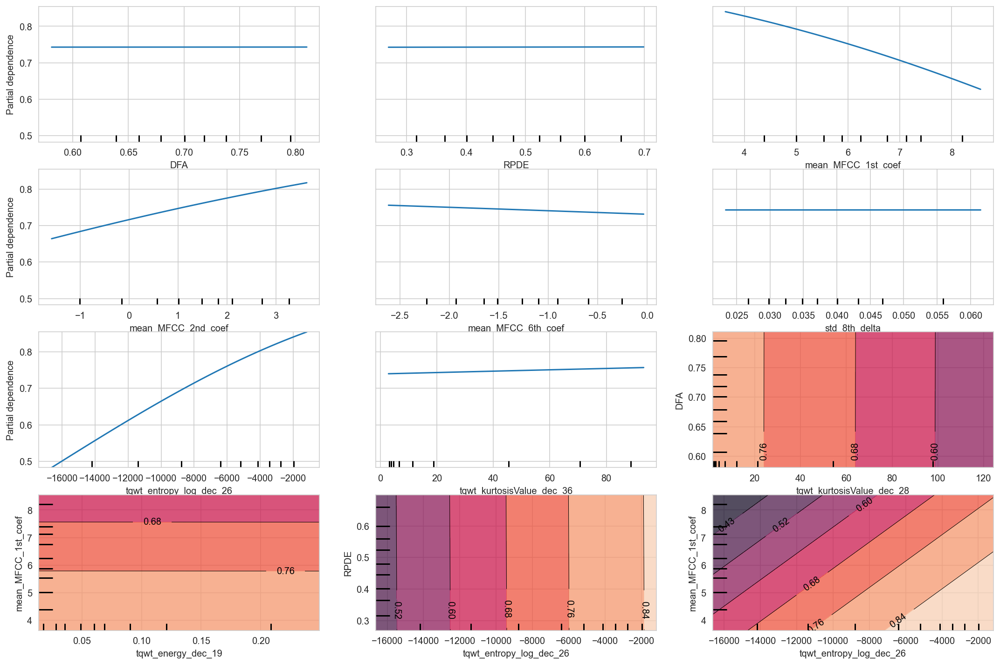

In [38]:
# Inspecting dependency plots

from sklearn.inspection import plot_partial_dependence
clf1 = LogisticRegression()
clf2 = GradientBoostingClassifier(n_estimators = 500, max_depth = 3)

clf1.fit(X_train_lasso, y_train_lasso)
clf2.fit(X_train_lasso, y_train_lasso)

target_features = [
    'DFA', 'RPDE', 'mean_MFCC_1st_coef', 'mean_MFCC_2nd_coef',
    'mean_MFCC_6th_coef', 'std_8th_delta', 'tqwt_entropy_log_dec_26', 'tqwt_kurtosisValue_dec_36',
    ('tqwt_kurtosisValue_dec_28', 'DFA'), ('tqwt_energy_dec_19', 'mean_MFCC_1st_coef'),
    ('tqwt_entropy_log_dec_26','RPDE'), ('tqwt_entropy_log_dec_26','mean_MFCC_1st_coef')
]
fig, ax = plt.subplots(figsize=(15, 10))
plot_partial_dependence(
    clf1, X_test_lasso, target_features,
    feature_names = data_lasso.columns, ax = ax
)
plt.tight_layout()

Sur les variables sélectionnées, certaines ont une plus grande influence sur la probabilité d'obtenir une classe, c'est à dire, qu'il existe parmi le nombre limité de variables sélectionnées, celles qui sont plus déterminantes pour la détection du syndrôme de Parkinson.

## 5) Utilisation des baseline features seulement 
Cette section reprend la méthode de sélection de variables évoquée dans [1]. Les baseline features sont des transformations assez directes du signal audio, qui ne nécessitent pas beaucoup d'étapes de pré-traitement. 24 telles features sont sélectionnées. Les algorithmes de ML sont ensuite testés, et une comparaison est faite par rapport à la sélection LASSO.

In [39]:
baseline_features = [i for i in range(2,26)]
data_baseline = data_scale.loc[:,baseline_features]
data_baseline.columns = data.columns[baseline_features]
data_baseline.head()

,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,locAbsJitter,rapJitter,...,apq3Shimmer,apq5Shimmer,apq11Shimmer,ddaShimmer,meanAutoCorrHarmonicity,meanNoiseToHarmHarmonicity,meanHarmToNoiseHarmonicity,minIntensity,maxIntensity,meanIntensity
0,0.936278,0.565310,0.583000,0.262983,0.263274,0.548552,0.021947,0.071532,0.066124,0.058930,...,0.210444,0.157709,0.172879,0.210485,0.930261,0.046782,0.549743,0.748251,0.757528,0.720013
1,0.837434,0.489455,0.537514,0.256354,0.256637,0.566485,0.018001,0.063181,0.060259,0.045331,...,0.156103,0.166871,0.222206,0.156147,0.963248,0.022804,0.629066,0.701531,0.685421,0.699252
2,0.934385,0.428738,0.607479,0.254144,0.254425,0.573975,0.014344,0.056282,0.054786,0.049864,...,0.374253,0.311323,0.279111,0.374260,0.940123,0.033761,0.507133,0.615493,0.651928,0.622946
3,0.426804,0.819111,0.611315,0.194475,0.194690,0.805881,0.049580,0.144517,0.175196,0.133273,...,0.162001,0.125000,0.159672,0.162018,0.924253,0.054377,0.577325,0.862436,0.873990,0.869087
4,0.330615,0.822669,0.524431,0.258564,0.258850,0.557581,0.765643,0.186638,0.168159,0.148685,...,0.202422,0.149058,0.189117,0.202464,0.942339,0.034847,0.567561,0.868565,0.872485,0.868930


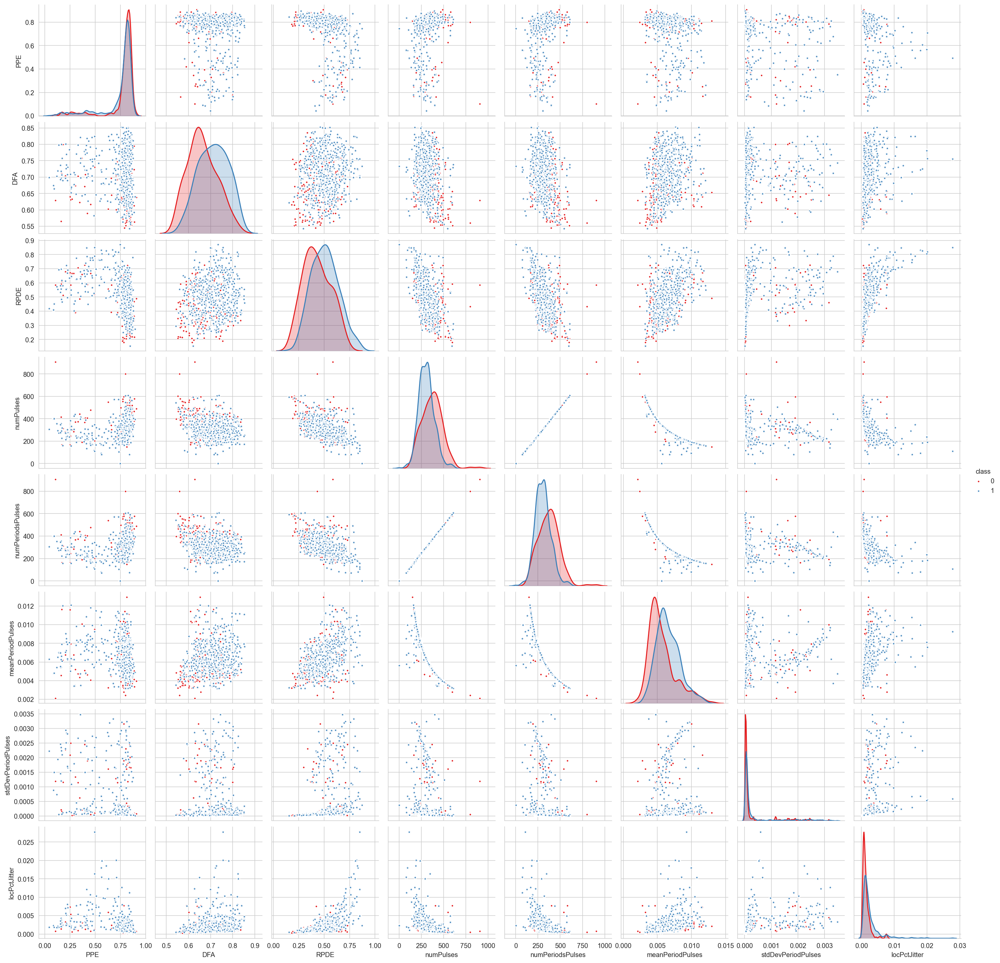

In [40]:
# Explore relationships between variables
sns.pairplot(pd.concat((data.loc[:,data_baseline.columns[:8]], classes), axis = 1), hue = 'class', 
             palette = 'Set1', markers = ['.', '*']);

On observe là aussi des variables dont les distributions se rapprochent, avec une légère distinction entre les classes pour certaines variables. On observe aussi l'existence de structures de corrélations entre les variables et la non corrélation de la cible avec un grand nombre de ces features. 

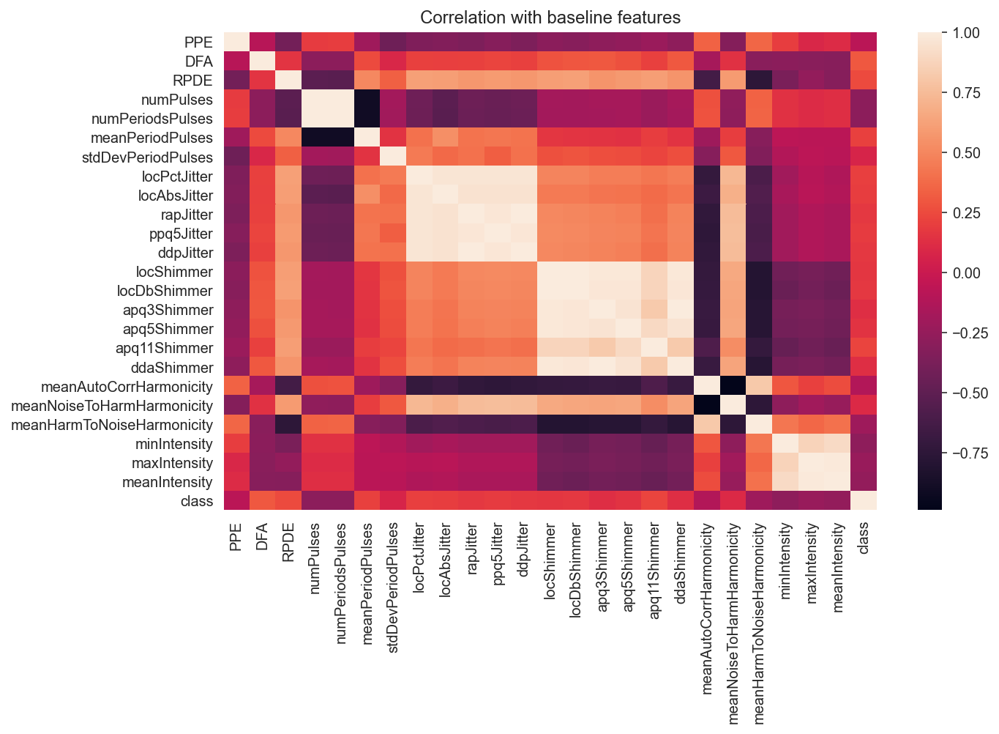

In [41]:
# Display correlation
plt.figure(figsize = (10,6))
corr2 = pd.concat((data.loc[:,data_baseline.columns], classes), axis = 1).corr()
sns.heatmap(corr2)
plt.title('Correlation with baseline features');

Testons à présent nos algorithmes ML.

In [42]:
for model in [GradientBoostingClassifier(n_estimators = 200),
              RandomForestClassifier(n_estimators=100), 
              LinearSVC(), 
              SVC(kernel = 'rbf', C = 1),
              linear_model.LogisticRegression(), 
              KNeighborsClassifier(n_neighbors=10)]:
    print("score de", model, ":", np.round(cross_val_score(model, data_baseline, classes, cv=5).mean(),2))

score de GradientBoostingClassifier(n_estimators=200) : 0.77
score de RandomForestClassifier() : 0.78
score de LinearSVC() : 0.77
score de SVC(C=1) : 0.75
score de LogisticRegression() : 0.77
score de KNeighborsClassifier(n_neighbors=10) : 0.75


Les performances sont moindres, les baseline features expliquent moins le syndrôme de Parkinson. Il faut des transformations plus poussées, ce qui fait l'objet des deux sections suivantes.

## 6) Utilisation des Mel Frequency Cepstral Coefficients (MFCCs) seulement 
La même démarche est conduite, les features sélectionnées sont cette fois au nombre de 84.

In [43]:
mfcc_features = [i for i in range(56, 140)]
data_mfcc = data_scale.loc[:,mfcc_features]
data_mfcc.columns = data.columns[mfcc_features]
data_mfcc.head()

,mean_Log_energy,mean_MFCC_0th_coef,mean_MFCC_1st_coef,mean_MFCC_2nd_coef,mean_MFCC_3rd_coef,mean_MFCC_4th_coef,mean_MFCC_5th_coef,mean_MFCC_6th_coef,mean_MFCC_7th_coef,mean_MFCC_8th_coef,...,std_3rd_delta_delta,std_4th_delta_delta,std_5th_delta_delta,std_6th_delta_delta,std_7th_delta_delta,std_8th_delta_delta,std_9th_delta_delta,std_10th_delta_delta,std_11th_delta_delta,std_12th_delta_delta
0,0.672461,0.385653,0.722779,0.648846,0.484759,0.731312,0.346937,0.462952,0.490180,0.600344,...,0.180294,0.373930,0.134536,0.125508,0.284014,0.145856,0.508359,0.373844,0.084316,0.205378
1,0.754689,0.429966,0.724860,0.692990,0.433574,0.718811,0.386245,0.432672,0.451721,0.619676,...,0.221766,0.543528,0.073526,0.380722,0.277158,0.063120,0.458879,0.313749,0.283369,0.361185
2,0.647254,0.383614,0.645606,0.727579,0.432013,0.696454,0.333414,0.466983,0.543941,0.581994,...,0.233111,0.553073,0.333864,0.359732,0.398749,0.286932,0.560513,0.378369,0.268198,0.366212
3,0.800641,0.529844,0.563136,0.714858,0.561108,0.454339,0.431463,0.623976,0.571829,0.750225,...,0.144977,0.165315,0.196397,0.187372,0.204696,0.248291,0.166286,0.318698,0.220564,0.345012
4,0.860308,0.593744,0.538102,0.697982,0.569242,0.428663,0.427285,0.649625,0.585323,0.761666,...,0.195615,0.205002,0.169482,0.105506,0.203133,0.204688,0.191255,0.281546,0.207111,0.263367


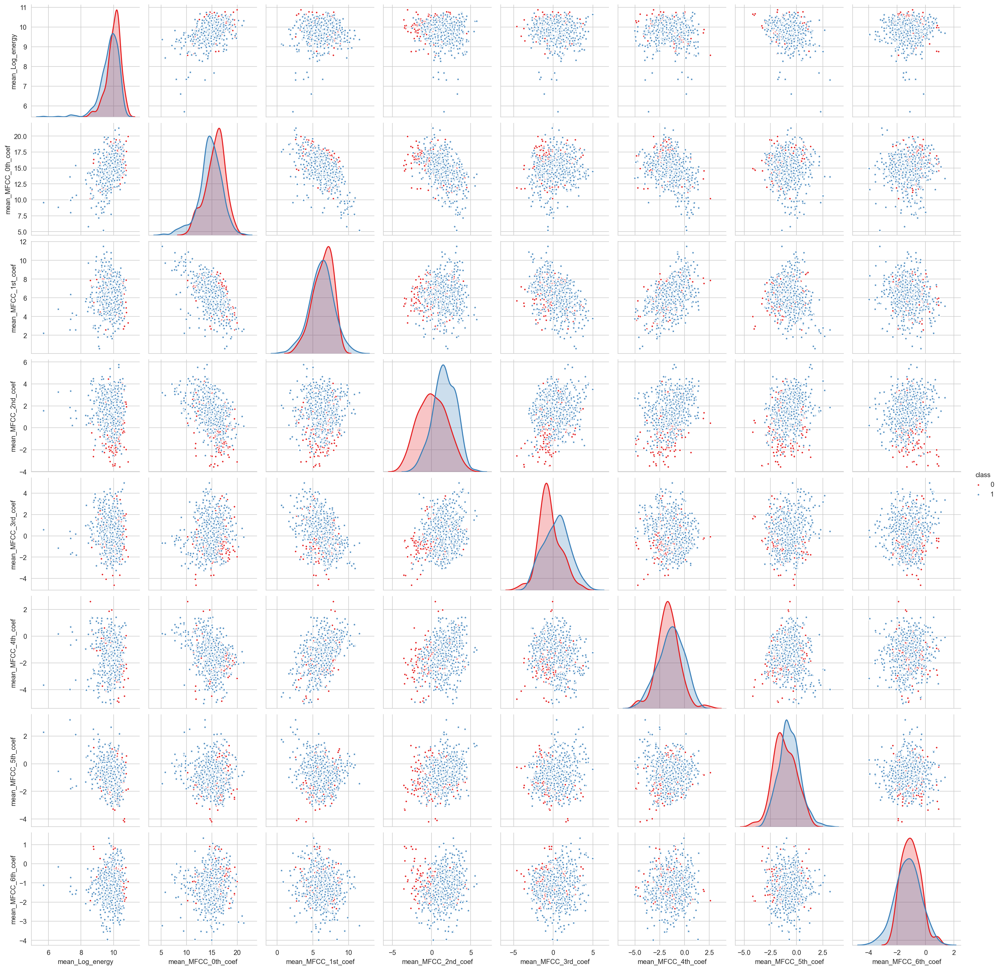

In [44]:
# Explore relationships between variables
sns.pairplot(pd.concat((data.loc[:,data_mfcc.columns[:8]], classes), axis = 1), hue = 'class', 
             palette = 'Set1', markers = ['.', '*']);

Les mêmes remarques s'appliquent ici:
- Distributions légèrement différentes entre les classes
- Existence de structures de corrélations

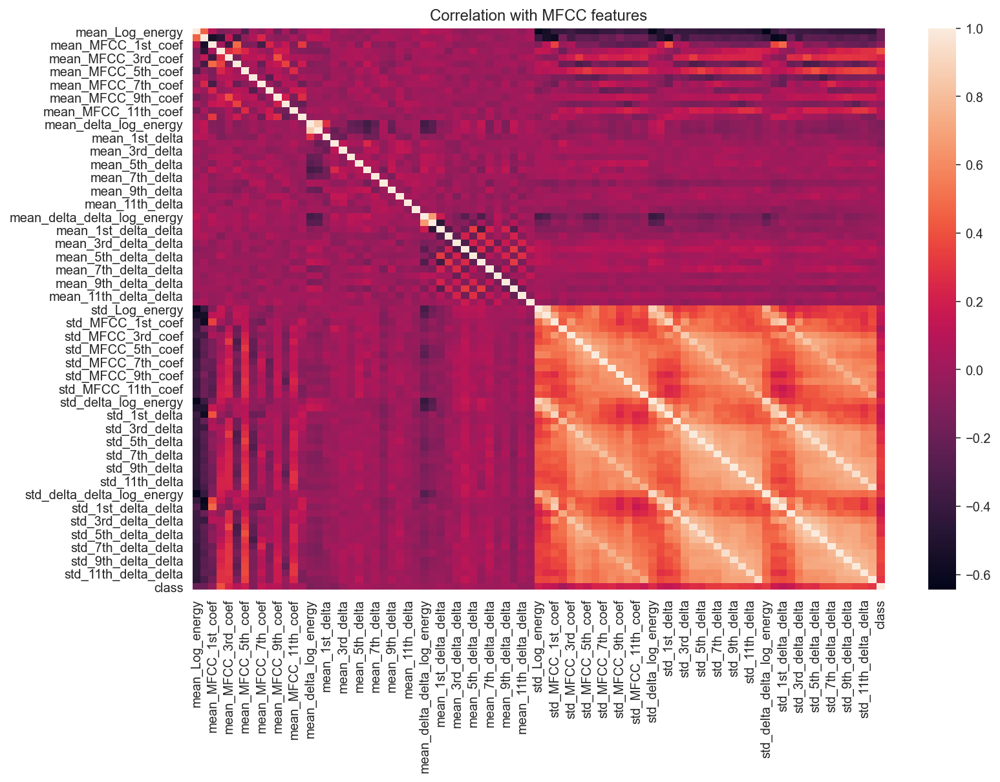

In [45]:
# Display correlation
plt.figure(figsize = (12,8))
corr3 = pd.concat((data.loc[:,data_mfcc.columns], classes), axis = 1).corr()
sns.heatmap(corr3)
plt.title('Correlation with MFCC features');

On s'attend à de meilleures performances des algorithmes ML, vu le nombre de features et la nature plus approfondie des transformations.

In [46]:
for model in [GradientBoostingClassifier(n_estimators = 200),
              RandomForestClassifier(n_estimators=100), 
              LinearSVC(), 
              SVC(kernel = 'rbf', C = 1),
              linear_model.LogisticRegression(), 
              KNeighborsClassifier(n_neighbors=10)]:
    print("score de", model, ":", np.round(cross_val_score(model, data_mfcc, classes, cv=5).mean(),2))

score de GradientBoostingClassifier(n_estimators=200) : 0.81
score de RandomForestClassifier() : 0.8
score de LinearSVC() : 0.8
score de SVC(C=1) : 0.81
score de LogisticRegression() : 0.81
score de KNeighborsClassifier(n_neighbors=10) : 0.79


Une amélioration est observée par rapport aux baseline features, mais la performance reste toujours inférieure à celle d'un modèle entrainé sur les variables sélectionnées par LASSO, parmi lesquelles figures des features issues de la QWT, auxquelles on s'intéresse dans la section suivante.

## 7) Utilisation des Wavelet Transform based Features (QWT) 
432 features sont créées à travers les transformations en ondelettes. ce qui fait un grand nombre (plus que la moitié des variables). On s'attend à ce que certaines d'entre elles ne soient pas informatives, et que seules un sous-ensemble de variables sera utile pour la détection du syndrôme de Parkinson.

In [47]:
qwt_features = [i for i in range(322, data.shape[1])]
data_qwt = data_scale.loc[:,qwt_features]
data_qwt.columns = data.columns[qwt_features]
data_qwt.head()

,tqwt_energy_dec_1,tqwt_energy_dec_2,tqwt_energy_dec_3,tqwt_energy_dec_4,tqwt_energy_dec_5,tqwt_energy_dec_6,tqwt_energy_dec_7,tqwt_energy_dec_8,tqwt_energy_dec_9,tqwt_energy_dec_10,...,tqwt_kurtosisValue_dec_27,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36
0,0.000258,0.000089,0.000085,0.000057,0.000132,0.000621,0.003483,0.005691,0.004512,0.002788,...,0.000576,0.000219,0.005515,0.019054,0.024520,0.039777,0.039411,0.012611,0.018790,0.107598
1,0.000665,0.000230,0.000192,0.000160,0.000213,0.000402,0.001937,0.004153,0.004644,0.003091,...,0.000594,0.000206,0.010303,0.182833,0.123920,0.110245,0.109584,0.077525,0.078923,0.277905
2,0.000782,0.000213,0.000138,0.000086,0.000135,0.000571,0.003254,0.005312,0.003558,0.002181,...,0.000557,0.000229,0.003960,0.065964,0.089574,0.110145,0.044197,0.017594,0.021472,0.015595
3,0.001183,0.000917,0.000715,0.000755,0.001125,0.000668,0.001429,0.001930,0.001847,0.000666,...,0.015906,0.009530,0.010084,0.030618,0.122368,0.029052,0.042515,0.049618,0.077518,0.011011
4,0.001032,0.001123,0.001052,0.000832,0.001143,0.000692,0.001148,0.001991,0.002316,0.000666,...,0.018467,0.019569,0.021359,0.037492,0.039965,0.071521,0.139915,0.105554,0.055767,0.024357


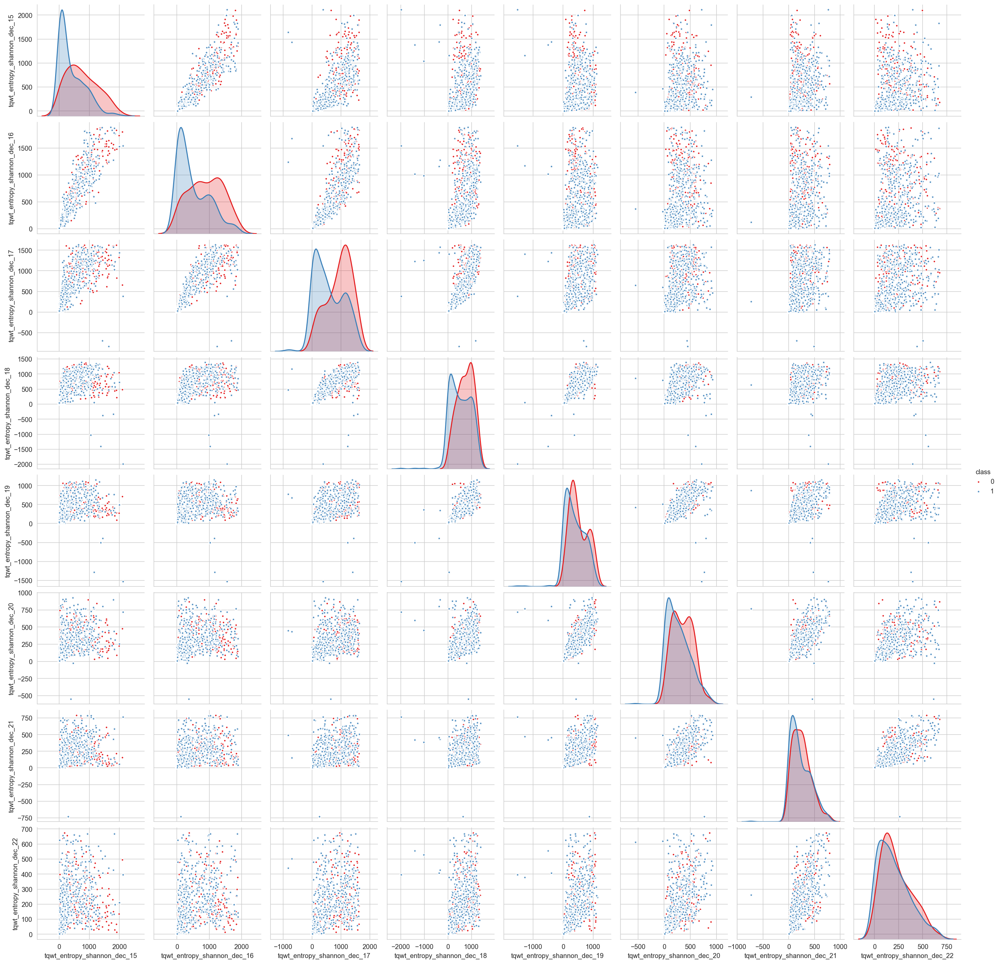

In [48]:
# Explore relationships between variables
sns.pairplot(pd.concat((data.loc[:,data_qwt.columns[50:58]], classes), axis = 1), hue = 'class', 
             palette = 'Set1', markers = ['.', '*']);

Sur les corrélations, on observe la répétition à plusieurs reprises, d'une même structure de corrélations, et de corrélations inverses. Ceci pourrait nuire à la qualité de prédiction. Aussi, on observe 0 corrélation entre beaucoup de variables (la zone au centre). 

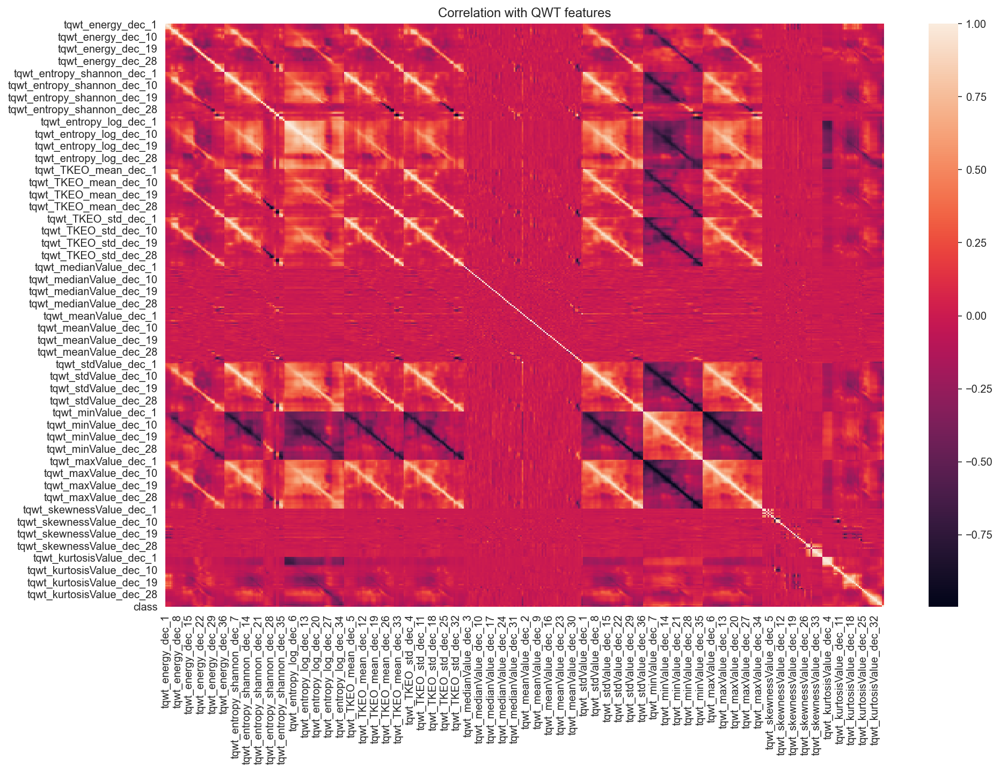

In [49]:
# Display correlation
plt.figure(figsize = (15,10))
corr4 = pd.concat((data.loc[:,data_qwt.columns], classes), axis = 1).corr()
sns.heatmap(corr4)
plt.title('Correlation with QWT features');

In [50]:
for model in [GradientBoostingClassifier(n_estimators = 200),
              RandomForestClassifier(n_estimators = 100), 
              LinearSVC(), 
              SVC(kernel = 'rbf', C = 1),
              linear_model.LogisticRegression(), 
              KNeighborsClassifier(n_neighbors = 10)]:
    print("score de", model, ":", np.round(cross_val_score(model, data_qwt, classes, cv=5).mean(),2))

score de GradientBoostingClassifier(n_estimators=200) : 0.82
score de RandomForestClassifier() : 0.82
score de LinearSVC() : 0.8
score de SVC(C=1) : 0.82
score de LogisticRegression() : 0.84
score de KNeighborsClassifier(n_neighbors=10) : 0.8


Les performances de la plupart des algorithmes s'améliore mais nous avons la conviction qu'on puisse faire mieux en combinant les méthodes de transformations, et en réduisant le nombre de features issues de la QWT. Nous comparons dans ce qui suit les performances sur le jeu de données initiales complètes. 

## 8) Utilisation des données complètes
L'utilisation des données complète a le grand désavantage d'être très coûteuse en termes de temps de calcul. Parmi les méthodes envisagées figurent celles qui sont non-paramétriques, ce qui nécessite beaucoup d ecalcul vu la taille très large de la matrice de données.

In [51]:
for model in [GradientBoostingClassifier(n_estimators = 500),
              RandomForestClassifier(n_estimators = 200), 
              LinearSVC(), 
              SVC(kernel = 'rbf', C = 1),
              LogisticRegression(), 
              KNeighborsClassifier(n_neighbors = 10)]:
    print("score de", model, ":", np.round(cross_val_score(model, data_scale, classes, cv=5).mean(),2))

score de GradientBoostingClassifier(n_estimators=500) : 0.79
score de RandomForestClassifier(n_estimators=200) : 0.84
score de LinearSVC() : 0.79
score de SVC(C=1) : 0.84
score de LogisticRegression() : 0.83
score de KNeighborsClassifier(n_neighbors=10) : 0.8


Bien que la prédiction sur l'ensemble des données soit précise, nous pouvons améliorer cette précision en réduisant le nombre de prédicteurs. La méthode de sélection LASSO sélectionne des variables combinant les différentes transformations, ce qui permet d'obtenir une précision d'environ 87%. Le sous-ensemble de variables est donc très informatif sur la présence du syndrôme de Parkinson. 

# IV. Plus de performance: stacking
___
Dans cette partie, nous cherchons à dépasser la précision de 87%. Pour cela, nous envisageons des méthodes plus poussées de Machine Learning: le **stacking**. Les estimateurs utilisés sont les suivants:

In [52]:
lis = [('Gradient Boosting', GradientBoostingClassifier(n_estimators = 500)),
       ('Random Forests', RandomForestClassifier(n_estimators = 200)),
       ('Linear SVM', LinearSVC()),
       ('Gaussian kernel SVM', SVC(kernel = 'rbf', C = 1)),
       ('Logistic regression', LogisticRegression()),
       ('knn classifier', KNeighborsClassifier(n_neighbors = 10))]

final = LogisticRegression()

Nous procédons ensuite à la prédiction, par stacking, sur les variables sélectionnées par LASSO.

In [53]:
clf = StackingClassifier(estimators = lis, 
                        final_estimator = final,
                        cv = 5, 
                        n_jobs = -1)

In [54]:
clf.fit(data_lasso, classes)

StackingClassifier(cv=5,
                   estimators=[('Gradient Boosting',
                                GradientBoostingClassifier(n_estimators=500)),
                               ('Random Forests',
                                RandomForestClassifier(n_estimators=200)),
                               ('Linear SVM', LinearSVC()),
                               ('Gaussian kernel SVM', SVC(C=1)),
                               ('Logistic regression', LogisticRegression()),
                               ('knn classifier',
                                KNeighborsClassifier(n_neighbors=10))],
                   final_estimator=LogisticRegression(), n_jobs=-1)

In [55]:
print("Score Stacking:", np.round(cross_val_score(clf, data_lasso, classes, cv = 5).mean(),2))

Score Stacking: 0.87


La performance obtenue par Stacking est aussi de 87%, ce qui est très satisfaisant par rapport aux performances obtenues dans [1]. En revenche, on n'arrive pas à faire mieux que la régression logistique. On pourrait chercher plus de performance en entraînant des architectures de type réseaux de neurones, ce qui serait une piste envisageable à l'issue de notre étude.

# Conclusion
___
Les méthodes abordées dans le papier semblent être satisfaisantes pour la sélection d'attributs informatifs pour le diagnostic du syndôme de Parkinson. L'objectif de ce travail était de trouver des procédures automatisées permettant d'atteindre le même niveau de performance. 

Parmi ces procédures, des méthodes non-supervisées et supervisées ont été abordées. Les meilleurs résultats ont été obtenus sur les variables sélectionnées par la procédure LASSO, ces variables étant créées à l'issue d'étapes de pré-traitement sur les enregistrements vocaux des patients, et sont regrouppées par familles de transformations.

En examinant de près les variables, le LASSO sélectionne les plus pertinentes parmi les familles de transformations initiales. En termes d'information apportée, la nouvelle approche, basée sur les transformations en ondelettes à Q facteurs, apporte beaucoup d'information pour le diagnostic du syndrôme de Parkinson. La procédure LASSO sélectionne un nombre significatif de variables dans cette catégorie. 

Enfin, des méthodes plus poussées, mais plus difficiles à interpréter, ont été abordées. C'est le cas du Stacking. L'utilisation de ces méthodes dépendera du fait que ce que l'on cherche est bien de classifier de la manière la plus précise possible un individu, ou de comprendre quels sont les facteurs qui augmentent les chances qu'un individu soit porteur du syndrôme. L'utilisateur aura donc un compromis, ou un choix à réaliser, entre performance et interprétabilité. Les méthodes par réseaux de neurones, non abordées ici, peuvent constituer une suite à cette étude.



## Références
___
[1] Sakar, C.O., Serbes, G., Gunduz, A., Tunc, H.C., Nizam, H., Sakar, B.E., Tutuncu, M., Aydin, T., Isenkul, M.E. and Apaydin, H., 2018. *A comparative analysis of speech signal processing algorithms for Parkinson's disease classification and the use of the tunable Q-factor wavelet transform*. Applied Soft Computing, DOI